# Crop and Resize images

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from plantclef.utils import get_spark
from plantclef.plotting import plot_images_from_binary
from pyspark.sql import functions as F
from pyspark.sql.types import BinaryType
import cv2
import numpy as np
import matplotlib.pyplot as plt
import io

spark = get_spark(cores=8, memory="28g")
display(spark)

Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
24/06/19 04:11:05 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable
24/06/19 04:11:05 WARN SparkConf: Note that spark.local.dir will be overridden by the value set by the cluster manager (via SPARK_LOCAL_DIRS in mesos/standalone/kubernetes and LOCAL_DIRS in YARN).
24/06/19 04:11:06 WARN Utils: Service 'SparkUI' could not bind on port 4040. Attempting port 4041.


In [3]:
# Get list of stored filed in cloud bucket
root = "gs://dsgt-clef-plantclef-2024"
! date
! gcloud storage ls {root}/data/parquet_files

Wed Jun 19 04:11:08 UTC 2024
gs://dsgt-clef-plantclef-2024/data/parquet_files/
gs://dsgt-clef-plantclef-2024/data/parquet_files/PlantCLEF2022_web_training_images_1/
gs://dsgt-clef-plantclef-2024/data/parquet_files/PlantCLEF2022_web_training_images_4/
gs://dsgt-clef-plantclef-2024/data/parquet_files/PlantCLEF2024_test/
gs://dsgt-clef-plantclef-2024/data/parquet_files/PlantCLEF2024_training/
gs://dsgt-clef-plantclef-2024/data/parquet_files/PlantCLEF2024_training_cropped_resized/
gs://dsgt-clef-plantclef-2024/data/parquet_files/PlantCLEF2024_training_cropped_resized_v2/


In [4]:
# Path and dataset names
gcs_path = "gs://dsgt-clef-plantclef-2024/data/parquet_files/"
original_images = "PlantCLEF2024_training"
cropped_resized = "PlantCLEF2024_training_cropped_resized_v2"

# Define the GCS path to the Train parquet file
original_gcs_path = f"{gcs_path}{original_images}"
crop_resize_gcs_path = f"{gcs_path}{cropped_resized}"

# Read the Parquet file into a DataFrame
original_df = spark.read.parquet(original_gcs_path)
crop_resize_df = spark.read.parquet(crop_resize_gcs_path)

### original train images

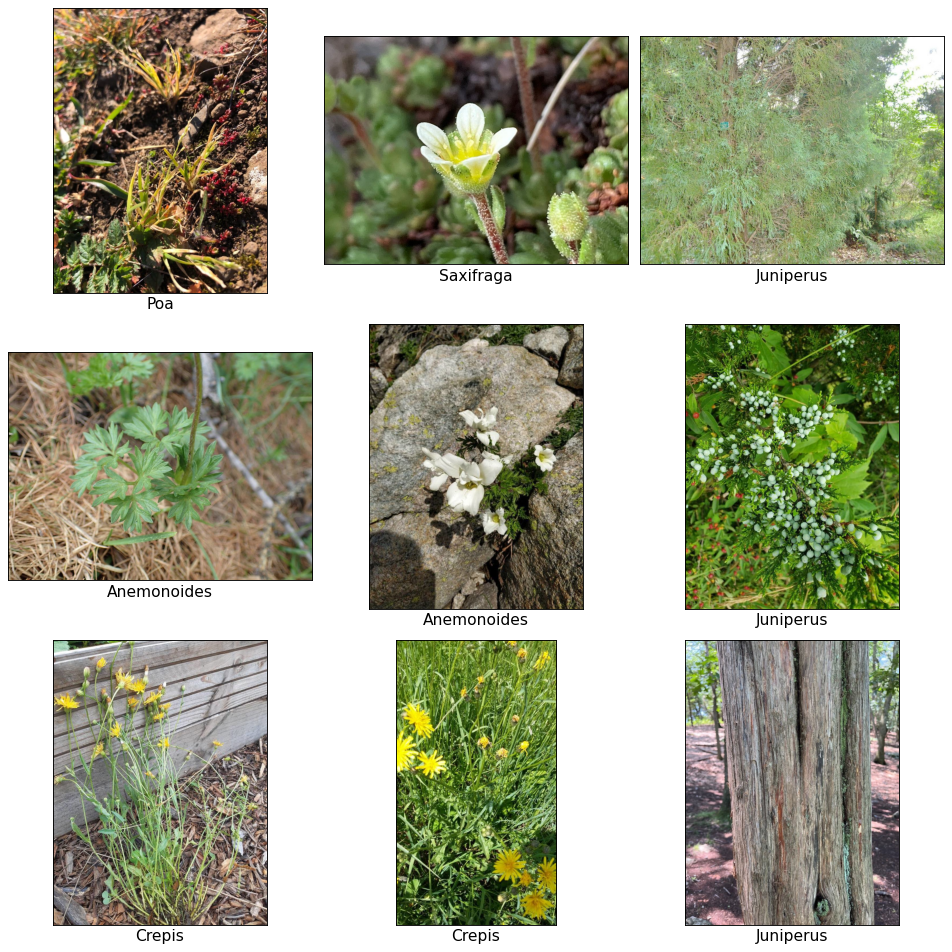

In [5]:
# Display the images in a grid with binomial names
plot_images_from_binary(
    original_df, data_col="data", image_col="genus", grid_size=(3, 3)
)

### cropped & resized images

In [6]:
# Define a UDF to crop and resize images
def crop_resize_images(data, target_width=256, target_height=256):
    """
    Crop the center of the image and resize it to the specific size.

    Args:
        data (bytes): The binary data of the image.
        size (tuple): the target size of the image after cropping and resizing.
    Returns:
        bytes: The binary data of the cropped and resized image.
    """
    # Convert binary data to NumPy array, then to image
    image = np.frombuffer(data, np.uint8)
    image = cv2.imdecode(image, cv2.IMREAD_COLOR)

    # Determine the size for cropping to a square
    height, width = image.shape[:2]
    crop_size = min(height, width)

    # Calculate crop coordinates to get the center square
    start_x = width // 2 - crop_size // 2
    start_y = height // 2 - crop_size // 2

    # Crop the center square
    image_cropped = image[start_y : start_y + crop_size, start_x : start_x + crop_size]

    # Resize the image
    target_size = target_width, target_height
    image_resized = cv2.resize(image_cropped, target_size, interpolation=cv2.INTER_AREA)

    # Convert the image back to binary data
    _, img_encoded = cv2.imencode(".jpg", image_resized)
    img_byte_arr = img_encoded.tobytes()

    return img_byte_arr

In [7]:
# Register the UDF with BinaryType return type
crop_resize_udf = F.udf(crop_resize_images, BinaryType())

# Select small batch size from DataFrame to test UDF
original_sub_df = original_df.limit(100)

# Apply the UDF to crop and resize the images
square_size = 128
crop_df = original_sub_df.withColumn(
    "cropped_image_data",
    crop_resize_udf(F.col("data"), F.lit(square_size), F.lit(square_size)),
)

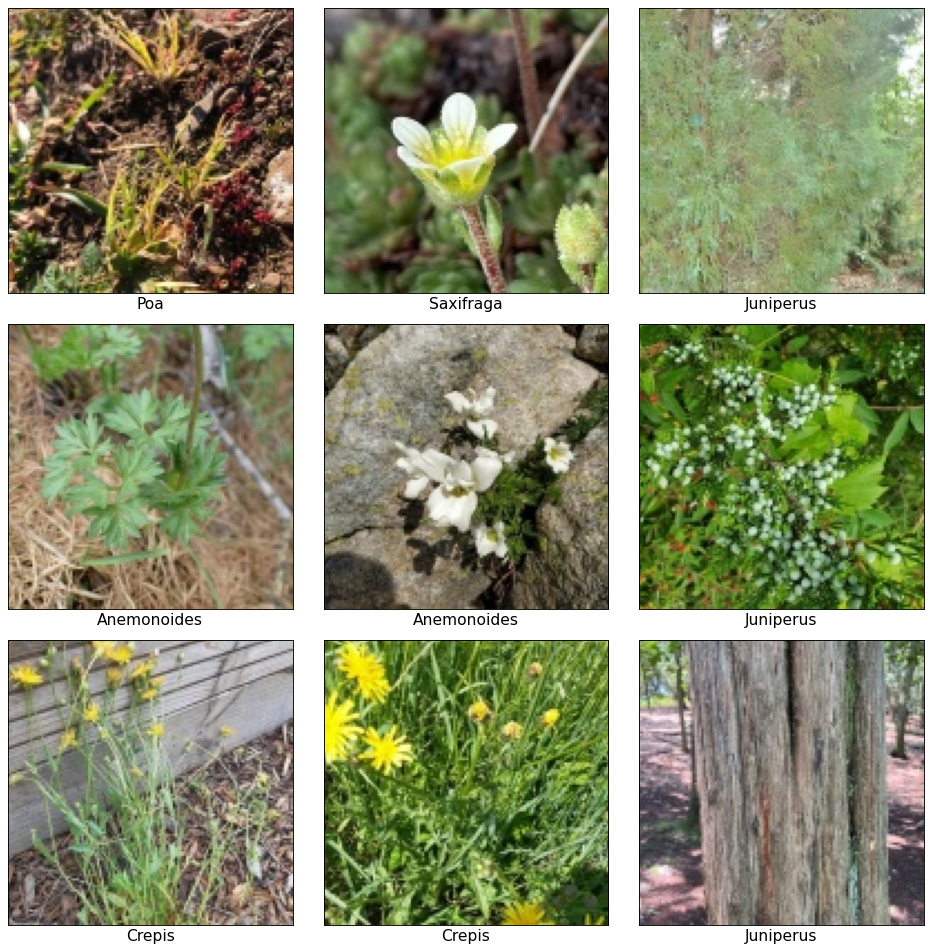

In [8]:
# Display the images in a grid with binomial names
plot_images_from_binary(
    crop_df, data_col="cropped_image_data", image_col="genus", grid_size=(3, 3)
)

## Side-by-side plot

In [9]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from pyspark.sql import DataFrame
from PIL import Image

plt.rc("font", size=14)  # controls default text size


def plot_cropped_resized_data(
    original_df: DataFrame,
    crop_df: DataFrame,
    grid_size: tuple = (3, 3),
):
    """
    Display images in a grid with binomial names as labels.

    :param original_df: DataFrame with the original image binary data.
    :param crop_df: DataFrame with the cropped and resized binary data.
    :param grid_size: Tuple (rows, cols) representing the grid size.
    """
    # Unpack the number of rows and columns for the grid
    rows, cols = grid_size
    # Create list of dataframes
    df_list = [original_df, crop_df]

    # Plot the data
    fig = plt.figure(figsize=(15, 7), dpi=300)
    fig.suptitle(
        f"Crop and Resize Pipeline",
        fontsize=22,
        weight="bold",
        y=1.07,  # add spce above the plots
    )
    # Plot titles
    titles = ["Original image data", "Cropped and Resized data"]
    data_col = ["data", "cropped_image_data"]

    for i, df in enumerate(df_list):
        # Collect binary image data from DataFrame
        subset_df = df.limit(rows * cols).collect()
        image_data_list = [row[data_col[i]] for row in subset_df]
        image_names = [row["genus"] for row in subset_df]

        # Create a GridSpec for the subplot
        gs = GridSpec(
            rows,
            cols,
            figure=fig,
            left=0.05 + i * 0.5,
            right=0.45 + i * 0.5,
            top=0.95,
            bottom=0.05,
            wspace=0.2,
            hspace=0.2,
        )

        for j in range(rows * cols):
            ax = fig.add_subplot(gs[j])
            # Convert binary data to an image and display it
            image = Image.open(io.BytesIO(image_data_list[j]))
            ax.imshow(image)
            name = image_names[j].replace("_", " ")
            ax.set_xlabel(name)  # Set the binomial name as xlabel
            ax.xaxis.label.set_size(14)  # Set the font size for the xlabel
            ax.set_xticks([])
            ax.set_yticks([])
        # Title for each grid
        fig.text(0.25 + i * 0.5, 0.98, titles[i], ha="center", fontsize=18)

    # fig.tight_layout(pad=2.0)
    path = Path(os.getcwd()).parents[1]
    plt.savefig(f"{path}/figures/crop_resize.png", bbox_inches="tight")
    plt.show()

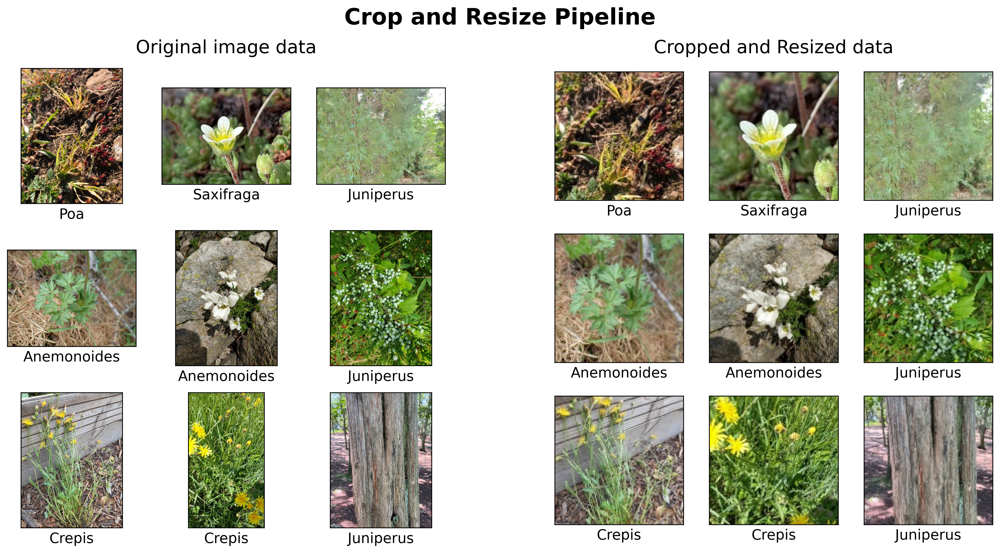

In [10]:
plot_cropped_resized_data(
    original_df=original_df,
    crop_df=crop_df,
    grid_size=(3, 3),
)